# INTERNPE INTERNSHIP, OCTOBER 2023

# ARTIFICIAL INTELLIGENCE AND MACHINE LEARNING INTERNSHIP

## PROBLEM STATEMENT

### Make a Breast Cancer Detection Model

## SOLUTION

## AUTHOR : ARITRA BAG

### IMPORTING LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
import gradio as gr

### IMPORTING DATASET

In [2]:
#Reading dataset from a .CSV file directly
dataset=pd.read_csv('/home/aritrabag/Documents/internship_projects/breast_cancer.csv')
dataset.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


### EXPLORATORY ANALYSIS OF THE RAW DATA

In [3]:
print('\nThe number of null values in the dataset is : \n' + str(dataset.isnull().sum()))
print('\nThe number of duplicate values in the dataset is : ' + str(dataset.duplicated().sum()))
print('\nThe datatypes in the dataset include :\n')
print(dataset.info())
print('\nThe data distribution in the columns is given by :\n')
print(dataset.describe())


The number of null values in the dataset is : 
id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst        

### DATA PREPROCESSING

#### DROPPING REDUNDANT FEATURES

We remove the 'id' column as it is not important while creating the classifier

In [4]:
dataset.drop(['id'],axis = 1, inplace =True)
dataset.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


#### DROPPING THE LAST COLUMN OF NULLS

In [5]:
dataset =  dataset.iloc[:,:-1]
dataset.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


#### ENCODING THE DIAGNOSIS VALUES

In [6]:
from sklearn.preprocessing import LabelEncoder
diagnosis_encoder = LabelEncoder()
dataset['diagnosis'] = diagnosis_encoder.fit_transform(dataset['diagnosis'])
dataset.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### EXPLORATORY ANALYSIS OF THE PREPROCESSED DATA

In [7]:
print('\nThe number of null values in the dataset is : \n' + str(dataset.isnull().sum()))
print('\nThe number of duplicate values in the dataset is : ' + str(dataset.duplicated().sum()))
print('\nThe datatypes in the dataset include :\n')
print(dataset.info())
print('\nThe data distribution in the columns is given by :\n')
print(dataset.describe())
print('\nThe correlation coefficients are : ' )
print(dataset.iloc[:,1:].corr())


The number of null values in the dataset is : 
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

The number of duplicate values in the d

### GRAPHICAL REPRESENTATION OF THE DATASET

This gives us a visual representation of the dataset

<Axes: xlabel='diagnosis', ylabel='Count'>

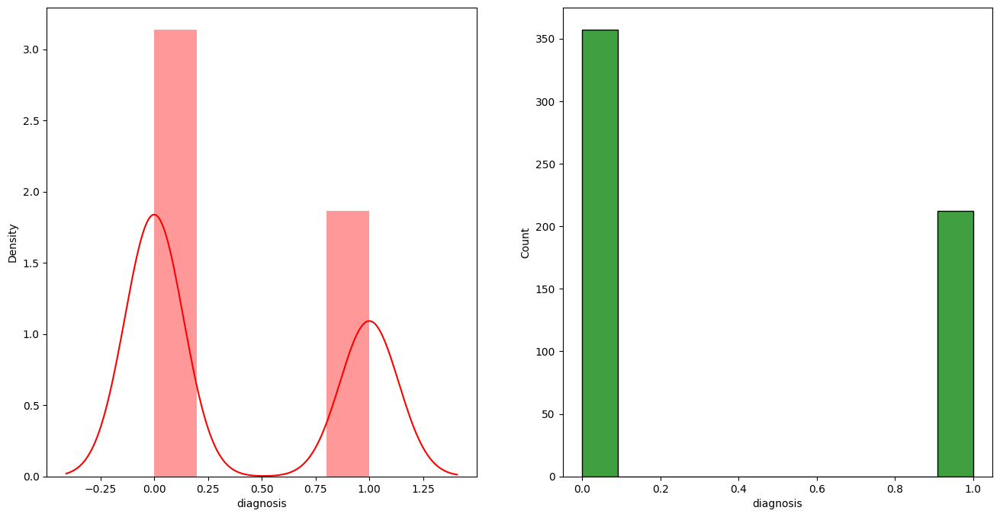

In [8]:
#Data Distribution
import warnings
warnings.filterwarnings("ignore")

plt.figure(figsize = (16,8))
plt.tight_layout(pad = 3.0)
plt.subplot(1,2,1)
sns.distplot(dataset['diagnosis'],color = 'red')
plt.subplot(1,2,2)
sns.histplot(dataset['diagnosis'],color = 'green')

<Axes: >

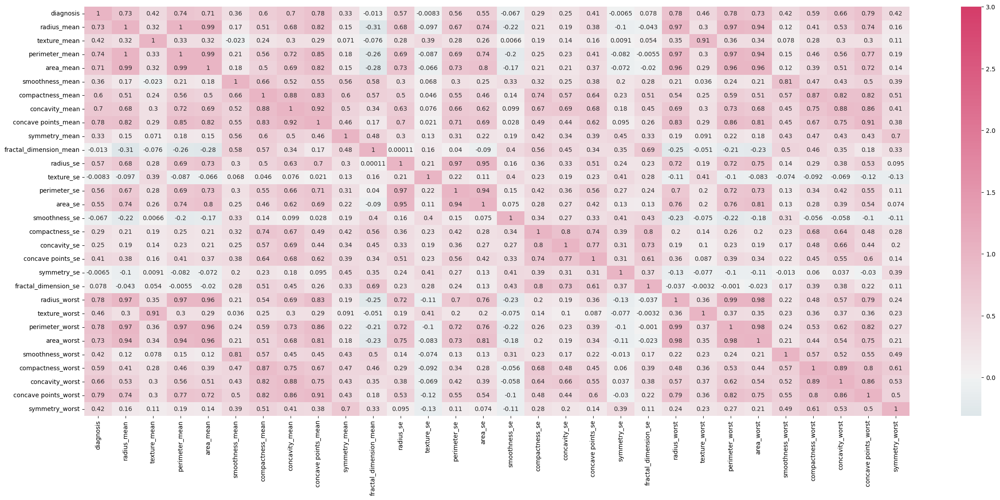

In [9]:
from numpy.lib.twodim_base import triu_indices_from
plt.figure(figsize = (30,12))
cmap = sns.diverging_palette(220,0, as_cmap = True)
sns.heatmap(dataset.iloc[:,:-1].corr(),cmap = cmap, center = 0, vmax = 3,annot = True)         

In [10]:
plt.figure(figsize = (40,15))
plt.tight_layout(pad = 3.0)
sns.pairplot(dataset, hue = 'diagnosis', markers = ["o", "s", "^"])

<Figure size 4000x1500 with 0 Axes>

### FEATURE ENGINEERING

In [11]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

#keeping a duplicate of the preprocessed data
dataset_raw = dataset

#Scaling the radius parameters
radius_scaler = MinMaxScaler()
dataset[['radius_mean', 'radius_se','radius_worst']] = radius_scaler.fit_transform(dataset[['radius_mean', 'radius_se','radius_worst']])

#Scaling the texture parameters
texture_scaler = MinMaxScaler()
dataset[['texture_mean', 'texture_se','texture_worst']] = texture_scaler.fit_transform(dataset[['texture_mean', 'texture_se','texture_worst']])

#Scaling the perimeter parameters
perimeter_scaler = MinMaxScaler()
dataset[['perimeter_mean', 'perimeter_se','perimeter_worst']] = perimeter_scaler.fit_transform(dataset[['perimeter_mean', 'perimeter_se','perimeter_worst']])

#Scaling the area parameters
area_scaler = MinMaxScaler()
dataset[['area_mean', 'area_se','area_worst']] = area_scaler.fit_transform(dataset[['area_mean', 'area_se','area_worst']])

#Scaling the smoothness parameters
smoothness_scaler = MinMaxScaler()
dataset[['smoothness_mean', 'smoothness_se','smoothness_worst']] = smoothness_scaler.fit_transform(dataset[['smoothness_mean', 'smoothness_se','smoothness_worst']])

#Scaling the compactness parameters
compactness_scaler = MinMaxScaler()
dataset[['compactness_mean', 'compactness_se','compactness_worst']] = compactness_scaler.fit_transform(dataset[['compactness_mean', 'compactness_se','compactness_worst']])

#Scaling the concavity parameters
concavity_scaler = MinMaxScaler()
dataset[['concavity_mean', 'concavity_se','concavity_worst']] = concavity_scaler.fit_transform(dataset[['concavity_mean', 'concavity_se','concavity_worst']])

#Scaling the concave points parameters
concave_points_scaler = MinMaxScaler()
dataset[['concave points_mean', 'concave points_se','concave points_worst']] = concave_points_scaler.fit_transform(dataset[['concave points_mean', 'concave points_se','concave points_worst']])

#Scaling the symmetry parameters
symmetry_scaler = MinMaxScaler()
dataset[['symmetry_mean', 'symmetry_se','symmetry_worst']] = smoothness_scaler.fit_transform(dataset[['symmetry_mean', 'symmetry_se','symmetry_worst']])

#Scaling the fractal_dimension parameters
fractal_dimension_scaler = MinMaxScaler()
dataset[['fractal_dimension_mean', 'fractal_dimension_se','fractal_dimension_worst']] = fractal_dimension_scaler.fit_transform(dataset[['fractal_dimension_mean', 'fractal_dimension_se','fractal_dimension_worst']])

dataset.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,0.521037,0.022658,0.545989,0.363733,0.593753,0.792037,0.703140,0.731113,0.686364,...,0.620776,0.141525,0.668310,0.450698,0.601136,0.619292,0.568610,0.912027,0.598462,0.418864
1,1,0.643144,0.272574,0.615783,0.501591,0.289880,0.181768,0.203608,0.348757,0.379798,...,0.606901,0.303571,0.539818,0.435214,0.347553,0.154563,0.192971,0.639175,0.233590,0.222878
2,1,0.601496,0.390260,0.595743,0.449417,0.514309,0.431017,0.462512,0.635686,0.509596,...,0.556386,0.360075,0.508442,0.374508,0.483590,0.385375,0.359744,0.835052,0.403706,0.213433
3,1,0.210090,0.360839,0.233501,0.102906,0.811321,0.811361,0.565604,0.522863,0.776263,...,0.248310,0.385928,0.241347,0.094008,0.915472,0.814012,0.548642,0.884880,1.000000,0.773711
4,1,0.629893,0.156578,0.630986,0.489290,0.430351,0.347893,0.463918,0.518390,0.378283,...,0.519744,0.123934,0.506948,0.341575,0.437364,0.172415,0.319489,0.558419,0.157500,0.142595


### SPLITTING INTO THE X(FEATURES) AND Y(TARGET)

We divide the data into "attributes" (inputs or features or X values) and "labels" (outputs or target or Y values).

In [12]:
features = dataset.iloc[:,1:]
targets = dataset.iloc[:,0]

In [13]:
features

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0.521037,0.022658,0.545989,0.363733,0.593753,0.792037,0.703140,0.731113,0.686364,0.605518,...,0.620776,0.141525,0.668310,0.450698,0.601136,0.619292,0.568610,0.912027,0.598462,0.418864
1,0.643144,0.272574,0.615783,0.501591,0.289880,0.181768,0.203608,0.348757,0.379798,0.141323,...,0.606901,0.303571,0.539818,0.435214,0.347553,0.154563,0.192971,0.639175,0.233590,0.222878
2,0.601496,0.390260,0.595743,0.449417,0.514309,0.431017,0.462512,0.635686,0.509596,0.211247,...,0.556386,0.360075,0.508442,0.374508,0.483590,0.385375,0.359744,0.835052,0.403706,0.213433
3,0.210090,0.360839,0.233501,0.102906,0.811321,0.811361,0.565604,0.522863,0.776263,1.000000,...,0.248310,0.385928,0.241347,0.094008,0.915472,0.814012,0.548642,0.884880,1.000000,0.773711
4,0.629893,0.156578,0.630986,0.489290,0.430351,0.347893,0.463918,0.518390,0.378283,0.186816,...,0.519744,0.123934,0.506948,0.341575,0.437364,0.172415,0.319489,0.558419,0.157500,0.142595
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,0.690000,0.428813,0.678668,0.566490,0.526948,0.296055,0.571462,0.690358,0.336364,0.132056,...,0.623266,0.383262,0.576174,0.452664,0.461137,0.178527,0.328035,0.761512,0.097575,0.105667
565,0.622320,0.626987,0.604036,0.474019,0.407782,0.257714,0.337395,0.486630,0.349495,0.113100,...,0.560655,0.699094,0.520892,0.379915,0.300007,0.159997,0.256789,0.559450,0.198502,0.074315
566,0.455251,0.621238,0.445788,0.303118,0.288165,0.254340,0.216753,0.263519,0.267677,0.137321,...,0.393099,0.589019,0.379949,0.230731,0.282177,0.273705,0.271805,0.487285,0.128721,0.151909
567,0.644564,0.663510,0.665538,0.475716,0.588336,0.790197,0.823336,0.755467,0.675253,0.425442,...,0.633582,0.730277,0.668310,0.402035,0.619626,0.815758,0.749760,0.910653,0.497142,0.452315


In [14]:
targets

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

#### GETTING THE BEST FIT LOGISTIC REGRESSION MODEL

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, classification_report, confusion_matrix

In [16]:
accuracies = []
f1s =[]
rocs = []
solvers = ['lbfgs', 'newton-cg', 'newton-cholesky']
for i in range (1000):
    for j in range (3):
        x_train, x_test, y_train, y_test = train_test_split (features, targets, random_state = i ,test_size = 0.2, shuffle = True)
        test_regressor = LogisticRegression(solver = solvers[j])
        test_regressor.fit(x_train,y_train)
        y_predict = test_regressor.predict(x_test)
        accuracies.append(accuracy_score(y_test,y_predict))
        f1s.append(f1_score(y_test,y_predict))
        rocs.append(roc_auc_score(y_test,y_predict))
        print('Trial run '+str(i+1)+'.'+str(j+1)+' completed : Accuracy Score =  '+str(accuracy_score(y_test,y_predict))+ ' F1 Score =  '+str(f1_score(y_test,y_predict))+' ROC_AUC Score =  '+str(roc_auc_score(y_test,y_predict)))     

Trial run 1.1 completed : Accuracy Score =  0.9649122807017544 F1 Score =  0.9555555555555556 ROC_AUC Score =  0.9574468085106382
Trial run 1.2 completed : Accuracy Score =  0.9649122807017544 F1 Score =  0.9555555555555556 ROC_AUC Score =  0.9574468085106382
Trial run 1.3 completed : Accuracy Score =  0.9649122807017544 F1 Score =  0.9555555555555556 ROC_AUC Score =  0.9574468085106382
Trial run 2.1 completed : Accuracy Score =  0.956140350877193 F1 Score =  0.9367088607594937 ROC_AUC Score =  0.9404761904761905
Trial run 2.2 completed : Accuracy Score =  0.956140350877193 F1 Score =  0.9367088607594937 ROC_AUC Score =  0.9404761904761905
Trial run 2.3 completed : Accuracy Score =  0.956140350877193 F1 Score =  0.9367088607594937 ROC_AUC Score =  0.9404761904761905
Trial run 3.1 completed : Accuracy Score =  0.9649122807017544 F1 Score =  0.9534883720930233 ROC_AUC Score =  0.9555555555555555
Trial run 3.2 completed : Accuracy Score =  0.9649122807017544 F1 Score =  0.9534883720930233

In [17]:
print('Best Accuracy score = ' + str(max(accuracies)))
accuracies_location = int(accuracies.index(max(accuracies)))
accuracy_best_random_state = int(accuracies_location/3)
accuracy_best_solver = solvers[int(accuracies_location%3)]
print ('Random State = ' + str(accuracy_best_random_state) + '  Solver = ' + str(accuracy_best_solver))

print('Best F1 score = ' + str(max(f1s)))
f1_location = int(f1s.index(max(f1s)))
f1_best_random_state = int(f1_location/3)
f1_best_solver = solvers[int(f1_location%3)]
print ('Random State = ' + str(f1_best_random_state) + '  Solver = ' + str(f1_best_solver))
      
print('Best ROC_AUC score = ' + str(max(rocs)))
roc_location = int(rocs.index(max(rocs)))
roc_best_random_state = int(roc_location/3)
roc_best_solver = solvers[int(roc_location%3)]
print ('Random State = ' + str(roc_best_random_state) + '  Solver = ' + str(roc_best_solver))

Best Accuracy score = 1.0
Random State = 10  Solver = lbfgs
Best F1 score = 1.0
Random State = 10  Solver = lbfgs
Best ROC_AUC score = 1.0
Random State = 10  Solver = lbfgs


### FINAL MODEL IMPLEMENTATION 

In [18]:
x_train, x_test, y_train, y_test = train_test_split (features, targets, random_state = 10 ,test_size = 0.2, shuffle = True)

In [19]:
breast_cancer_predictor = LogisticRegression(solver = 'lbfgs')

In [20]:
breast_cancer_predictor.fit(x_train,y_train)

LogisticRegression()

In [21]:
y_predicted = breast_cancer_predictor.predict(x_test)

### EVALUATION OF THE CLASSIFIER

The final step is to mathematically evaluate the performance of algorithm.

In [22]:
print('The classification test results are : \n')
print(classification_report(y_test,y_predicted))
print('Confusion Matrix :')
cm=confusion_matrix(y_test,y_predicted)
print(cm)
print('\n')
print('The test accuracy percentage is :')
print((accuracy_score(y_test,y_predicted))*100)
print('\n')
print('The test precision percentage is :')
print((precision_score(y_test,y_predicted))*100)
print('\n')
print('The test recall percentage is :')
print((recall_score(y_test,y_predicted))*100)
print('\n')
print('The test f1 percentage is :')
print((f1_score(y_test,y_predicted))*100)
print('\n')
print('The test ROC AUC score is :')
print(roc_auc_score(y_test,y_predicted))

The classification test results are : 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        39

    accuracy                           1.00       114
   macro avg       1.00      1.00      1.00       114
weighted avg       1.00      1.00      1.00       114

Confusion Matrix :
[[75  0]
 [ 0 39]]


The test accuracy percentage is :
100.0


The test precision percentage is :
100.0


The test recall percentage is :
100.0


The test f1 percentage is :
100.0


The test ROC AUC score is :
1.0


In [23]:
print(features.iloc[4,:])
print('\n')
print(targets[4])

radius_mean                0.629893
texture_mean               0.156578
perimeter_mean             0.630986
area_mean                  0.489290
smoothness_mean            0.430351
compactness_mean           0.347893
concavity_mean             0.463918
concave points_mean        0.518390
symmetry_mean              0.378283
fractal_dimension_mean     0.186816
radius_se                  0.233822
texture_se                 0.093065
perimeter_se               0.220563
area_se                    0.163688
smoothness_se              0.332359
compactness_se             0.167918
concavity_se               0.143636
concave points_se          0.357075
symmetry_se                0.136179
fractal_dimension_se       0.145800
radius_worst               0.519744
texture_worst              0.123934
perimeter_worst            0.506948
area_worst                 0.341575
smoothness_worst           0.437364
compactness_worst          0.172415
concavity_worst            0.319489
concave points_worst       0

In [24]:
print(breast_cancer_predictor.predict_proba([features.iloc[4,:]]))
print('\n')
print(breast_cancer_predictor.predict([features.iloc[4,:]]))

[[0.04988787 0.95011213]]


[1]


### SAVING THE MODEL

In [25]:
import pickle
pickle.dump(breast_cancer_predictor, open('/home/aritrabag/Documents/internship_projects/breast_cancer_predictor', 'wb'))

In [26]:
pickle.dump(radius_scaler, open('/home/aritrabag/Documents/internship_projects/radius_scaler.sav', 'wb'))
pickle.dump(texture_scaler, open('/home/aritrabag/Documents/internship_projects/texture_scaler.sav', 'wb'))
pickle.dump(perimeter_scaler, open('/home/aritrabag/Documents/internship_projects/perimeter_scaler.sav', 'wb'))
pickle.dump(area_scaler, open('/home/aritrabag/Documents/internship_projects/area_scaler.sav', 'wb'))
pickle.dump(smoothness_scaler, open('/home/aritrabag/Documents/internship_projects/smoothness_scaler.sav', 'wb'))
pickle.dump(compactness_scaler, open('/home/aritrabag/Documents/internship_projects/compactness_scaler.sav', 'wb'))
pickle.dump(concavity_scaler, open('/home/aritrabag/Documents/internship_projects/concavity_scaler.sav', 'wb'))
pickle.dump(concave_points_scaler, open('/home/aritrabag/Documents/internship_projects/concave_points_scaler.sav', 'wb'))
pickle.dump(symmetry_scaler, open('/home/aritrabag/Documents/internship_projects/symmetry_scaler.sav', 'wb'))
pickle.dump(fractal_dimension_scaler, open('/home/aritrabag/Documents/internship_projects/fractal_dimension_scaler.sav', 'wb'))